In [164]:
import os
import requests
from PIL import Image
from io import BytesIO
import pandas as pd
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Model
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

In [86]:
# Path to dataset
DATASET_PATH = "terminalx" 

# Load the CSV
csv_path = os.path.join(DATASET_PATH, "Scraped_Data_Plus_Type_And_Color.csv")
df = pd.read_csv(csv_path)

# Directory to save images
image_dir = os.path.join(DATASET_PATH, "images")
os.makedirs(image_dir, exist_ok=True)

# Function to download an image
def download_image(url, img_id):
    response = requests.get(url)
    if response.status_code == 200:
        img = Image.open(BytesIO(response.content))
        # Convert image to RGB if it has an alpha channel
        if img.mode == 'RGBA':
            img = img.convert('RGB')
        img_path = os.path.join(image_dir, f"{img_id}.jpg")
        img.save(img_path, format='JPEG')
        return img_path
    else:
        return None

# Download all images and add their paths to the dataframe
df['image_path'] = df.apply(lambda row: download_image(row['img'], row['_id']), axis=1)

# Filter out rows where image download failed
df = df[df['image_path'].notnull()]

# Display the first few rows of the dataframe
df.head()


,_id,code,img,title,price,link,gender,brand,category,occasion,type,color,image_path
0,668dad59e415d9bc6a43c684,TERMINALX-z3819400069,https://media.terminalx.com/pub/media/catalog/...,גופיית ווש עם שוליים גזורים / גברים,49.95 ₪,https://www.terminalx.com/men/shirts/sleevless...,men,BILLABONG,Topwear,Casual,sleevless-tops,9,terminalx/images/668dad59e415d9bc6a43c684.jpg
1,668dad59e415d9bc6a43c685,TERMINALX-x59233000510,https://media.terminalx.com/pub/media/catalog/...,גופייה עם לוגו,83.93 ₪,https://www.terminalx.com/men/shirts/sleevless...,men,VANS,Topwear,Casual,sleevless-tops,10,terminalx/images/668dad59e415d9bc6a43c685.jpg
2,668dad59e415d9bc6a43c686,TERMINALX-z84857001720,https://media.terminalx.com/pub/media/catalog/...,גופייה עם הדפס לוגו / גברים,83.93 ₪,https://www.terminalx.com/men/shirts/sleevless...,men,VANS,Topwear,Casual,sleevless-tops,20,terminalx/images/668dad59e415d9bc6a43c686.jpg
3,668dad59e415d9bc6a43c687,TERMINALX-w3387500014,https://media.terminalx.com/pub/media/catalog/...,חולצת פולו סרוגה,230.93 ₪,https://www.terminalx.com/men/shirts/polo/w338...,men,MANGO,Topwear,Party,polo,4,terminalx/images/668dad59e415d9bc6a43c687.jpg
4,668dad59e415d9bc6a43c688,TERMINALX-z9270000069,https://media.terminalx.com/pub/media/catalog/...,גופיית אימון עם לוגו,319.92 ₪,https://www.terminalx.com/men/shirts/sleevless...,men,ON RUNNING,Topwear,Casual,sleevless-tops,9,terminalx/images/668dad59e415d9bc6a43c688.jpg


<Axes: ylabel='type'>

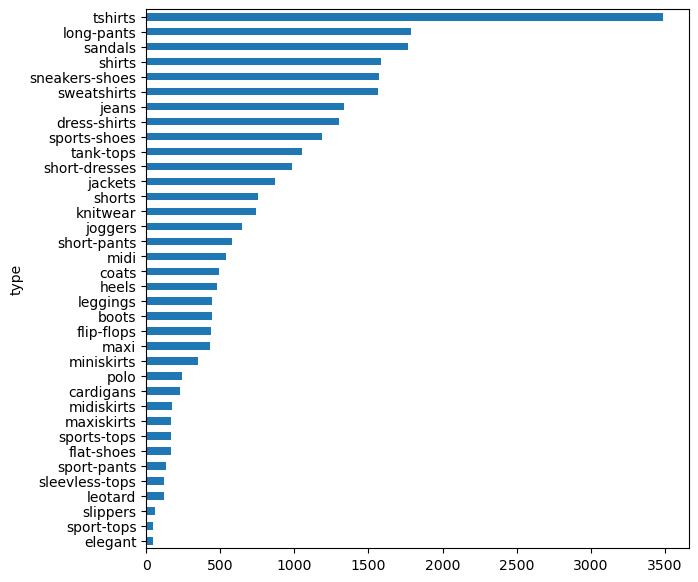

In [162]:
plt.figure(figsize=(7,7))
df.type.value_counts().sort_values().plot(kind='barh')

In [ ]:
# Load the pre-trained ResNet50 model without the top layers
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers on top of the pre-trained base model
x = base_model.output
x = GlobalAveragePooling2D()(x)
model = Model(inputs=base_model.input, outputs=x)

# Function to preprocess image and generate embedding
def get_embedding(model, img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    embedding = model.predict(x)
    return embedding.flatten()

# Generate embeddings for all items in the dataset
df['embedding'] = df['image_path'].apply(lambda x: get_embedding(model, x))

# Convert list of embeddings to a DataFrame
embeddings = np.vstack(df['embedding'].values)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━

In [220]:
# Apply K-Means clustering to create two clusters: one for women and one for men

num_clusters = 2  # We want two clusters: one for women and one for men
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
df['cluster'] = kmeans.fit_predict(embeddings)

# Add gender information to clusters
df['gender_cluster'] = df['gender'] + '_cluster_' + df['cluster'].astype(str)


In [184]:
# Compute cosine similarity between all embeddings
cosine_sim = 1 - pairwise_distances(embeddings, metric='cosine')


In [222]:
# Function to get recommendations based on cosine similarity and clustering, filtered by gender
def get_recommender(idx, df, top_n=5):
    gender_cluster = df.iloc[idx]['gender_cluster']
    cluster_items = df[df['gender_cluster'] == gender_cluster].index
    sim_scores = [(i, cosine_sim[idx][i]) for i in cluster_items]
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:top_n+1]  # Exclude the first one as it is the item itself
    idx_rec = [i[0] for i in sim_scores]
    sim_values = [i[1] for i in sim_scores]
    recommended_items = df.iloc[idx_rec]
    return recommended_items, sim_values


In [248]:
# Test the recommender with a specific item index

idx_test = 505 # Change this to test with different items
recommended_df, sim_values = get_recommender(idx_test, df, top_n=6)

print("Recommended Items:")
print(recommended_df[['type', 'color', 'gender','category']])


Recommended Items:
         type  color gender category
6981  tshirts    100    men  Topwear
506   tshirts  17762    men  Topwear
6760  tshirts      8    men  Topwear
651   tshirts   8965    men  Topwear
6977  tshirts     22    men  Topwear
6972  tshirts     10    men  Topwear


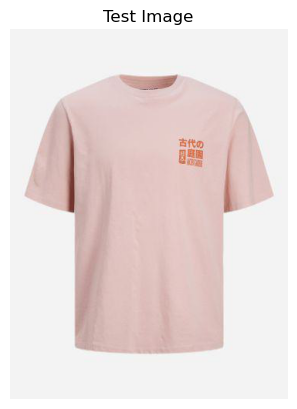

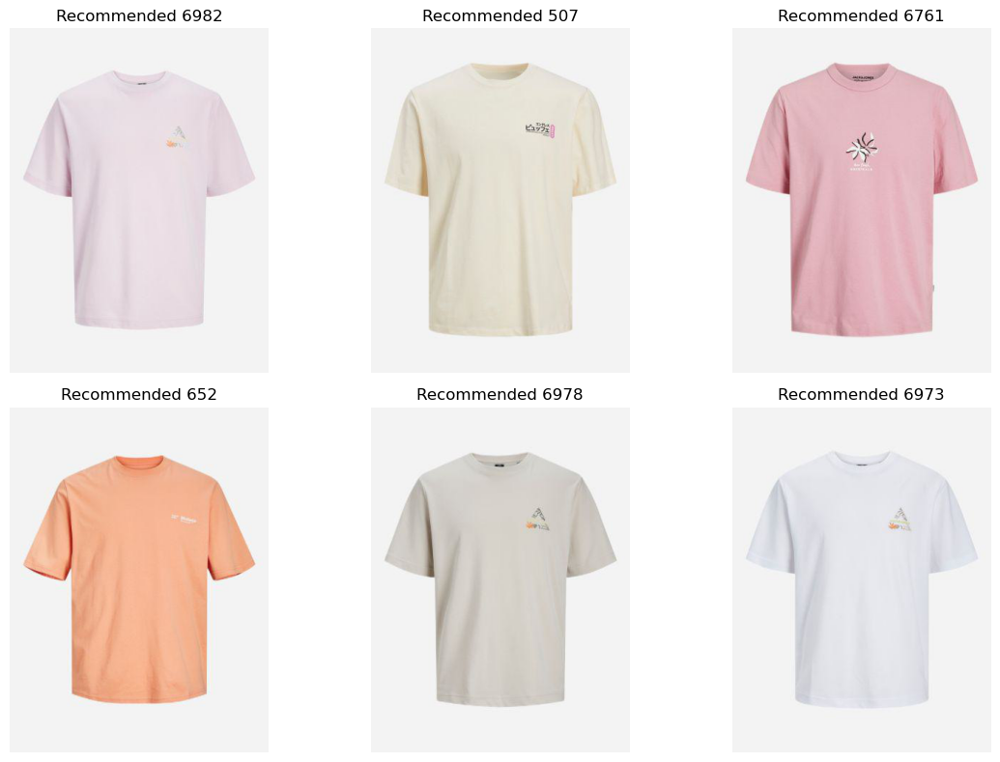

In [250]:
# Function to plot figures
def plot_figures(figures, nrows=1, ncols=1, figsize=(12, 8)):
    fig, axeslist = plt.subplots(ncols=ncols, nrows=nrows, figsize=figsize)
    for ind, title in enumerate(figures):
        axeslist.ravel()[ind].imshow(plt.imread(figures[title]))
        axeslist.ravel()[ind].set_title(title)
        axeslist.ravel()[ind].set_axis_off()
    plt.tight_layout()

# Plot the test image
plt.imshow(plt.imread(df.iloc[idx_test].image_path))
plt.title('Test Image')
plt.axis('off')
plt.show()

# Generate a dictionary of (title, images) for recommendations
figures = {f'Recommended {i+1}': row.image_path for i, row in recommended_df.iterrows()}

# Plot the images in a figure, with 2 rows and 3 columns
plot_figures(figures, 2, 3)
plt.show()


Recommended Items for image 3264:
         type color gender category
3297  tshirts    10    men  Topwear
7256  tshirts    10    men  Topwear
860   tshirts  8411    men  Topwear
1671  tshirts    22    men  Topwear
3745  tshirts    10    men  Topwear
1340  tshirts    10    men  Topwear


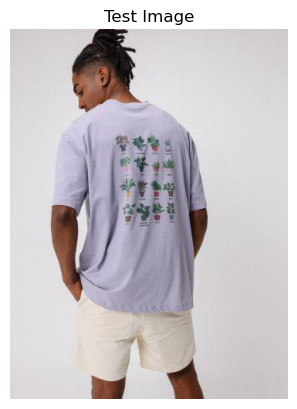

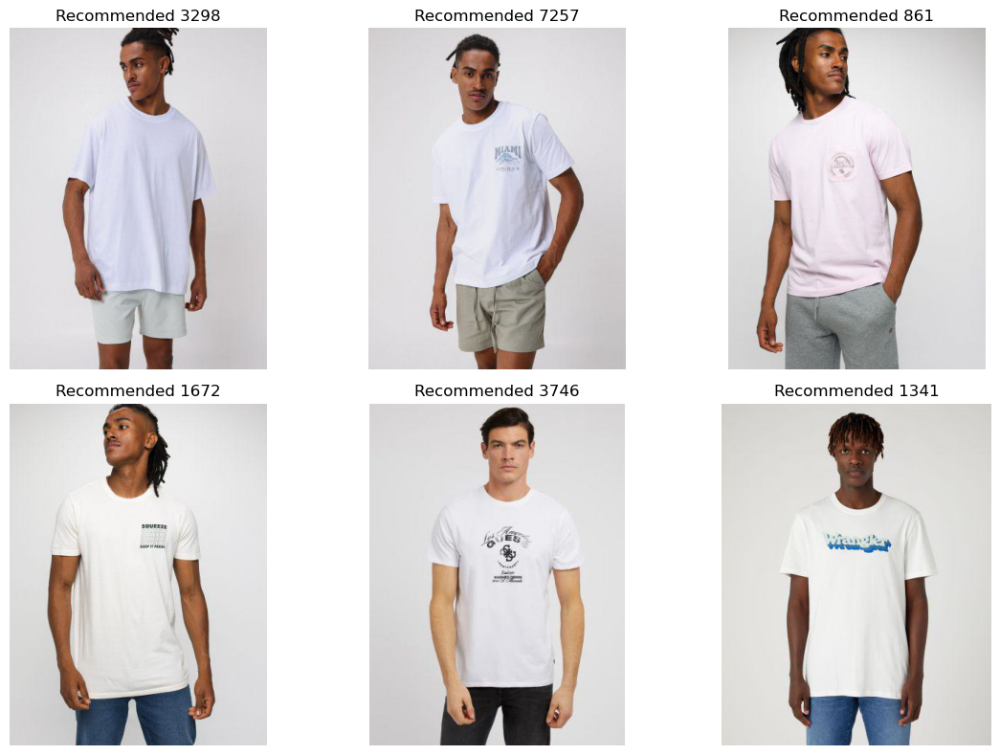

Recommended Items for image 24673:
            type color gender category
25655  cardigans  9670  women  Topwear
23741    jackets     9  women  Topwear
23787    jackets     9  women  Topwear
24676    jackets  2060  women  Topwear
23122    jackets  2060  women  Topwear
23138    jackets     4  women  Topwear


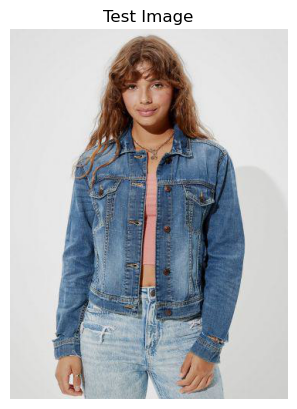

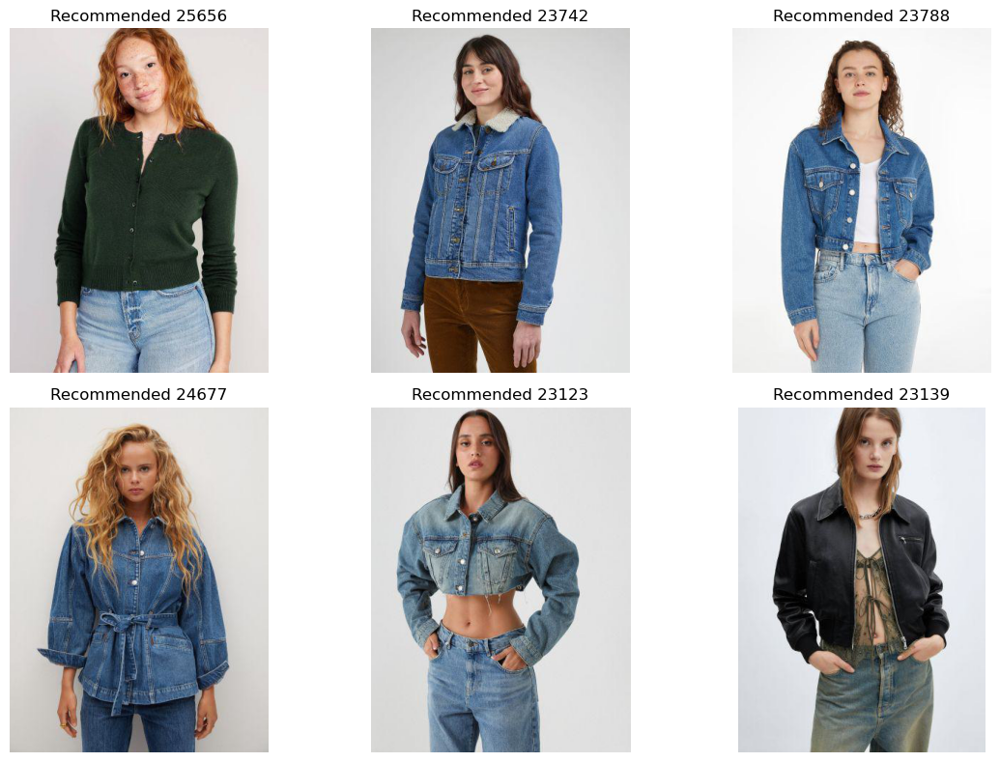

Recommended Items for image 4373:
             type color gender category
3737      tshirts     4    men  Topwear
7304      tshirts     4    men  Topwear
1179      tshirts  9998    men  Topwear
9162      tshirts     9    men  Topwear
894   sports-tops     4    men  Topwear
6724      tshirts  9077    men  Topwear


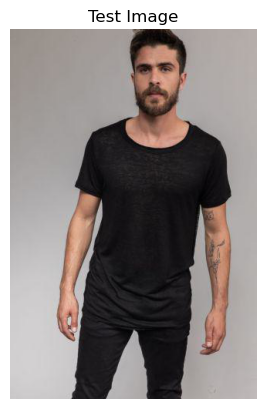

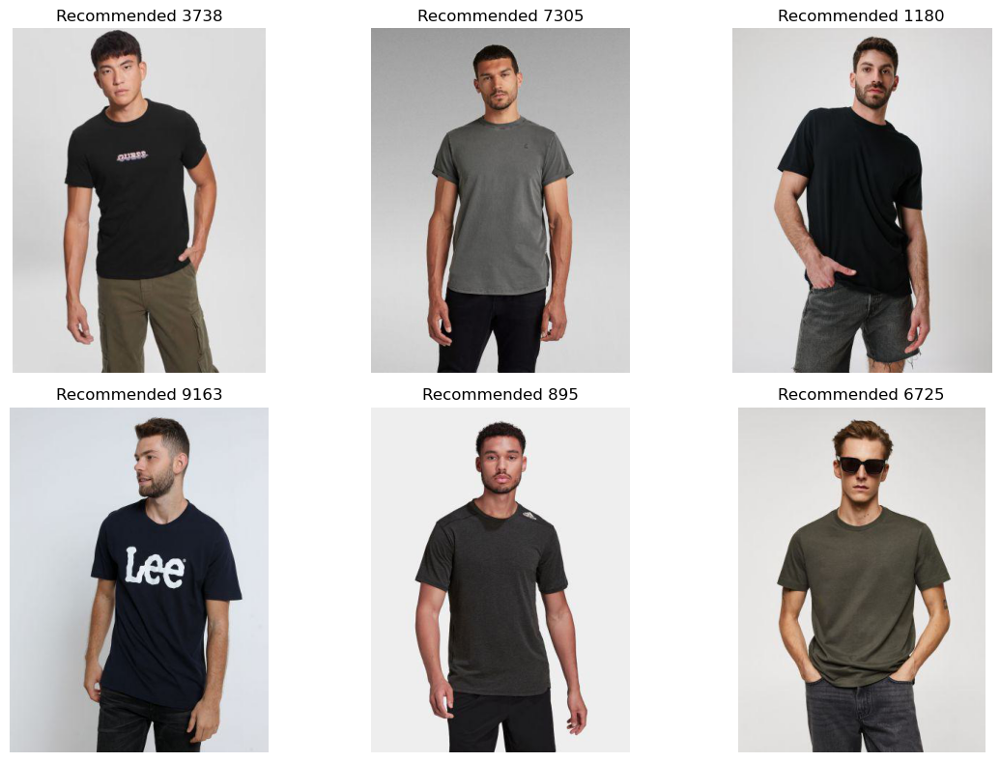

Recommended Items for image 9303:
             type  color gender    category
15202  long-pants     10  women  Bottomwear
18139  maxiskirts  17762  women  Bottomwear
8006       shirts     22  women     Topwear
18131  long-pants  17762  women  Bottomwear
16370        maxi   8602  women  Bottomwear
11821   tank-tops     22  women     Topwear


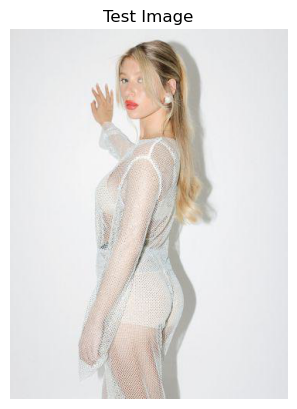

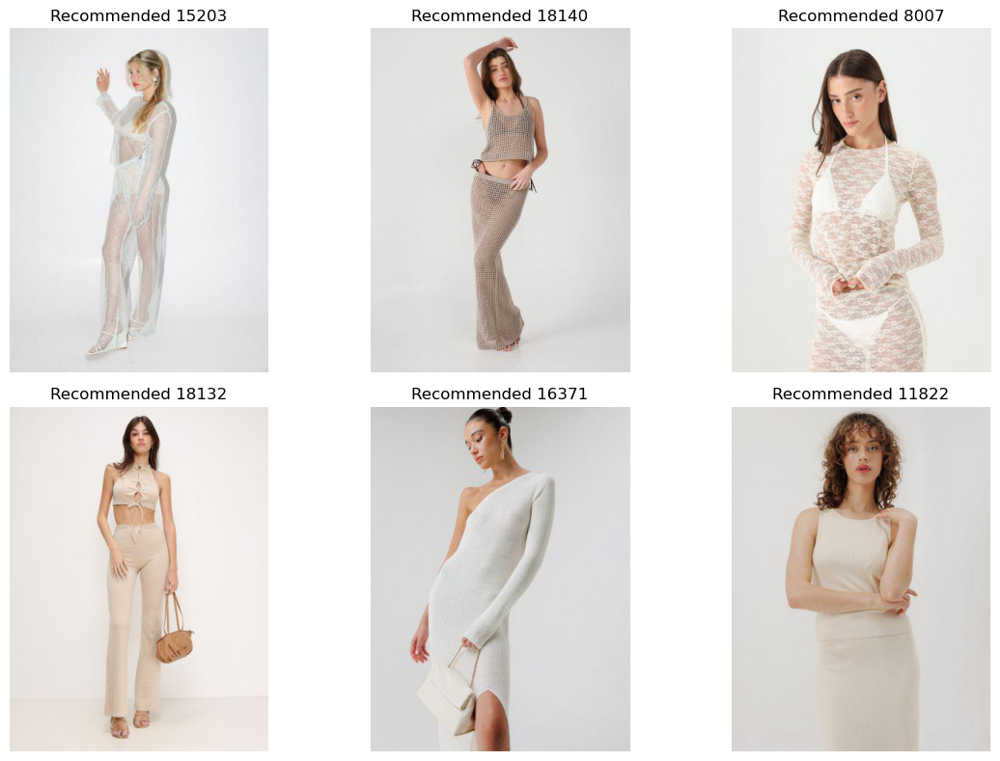

Recommended Items for image 22922:
             type color gender  category
20375     sandals     9  women  Footwear
22921     sandals     8  women  Footwear
22302       heels     6  women  Footwear
21923     sandals   468  women  Footwear
20893     sandals     8  women  Footwear
20766  flat-shoes     8  women  Footwear


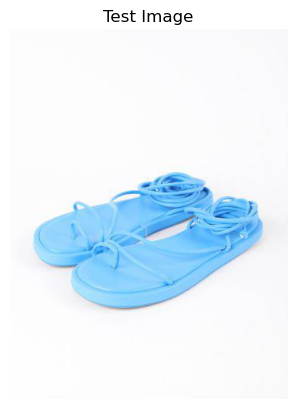

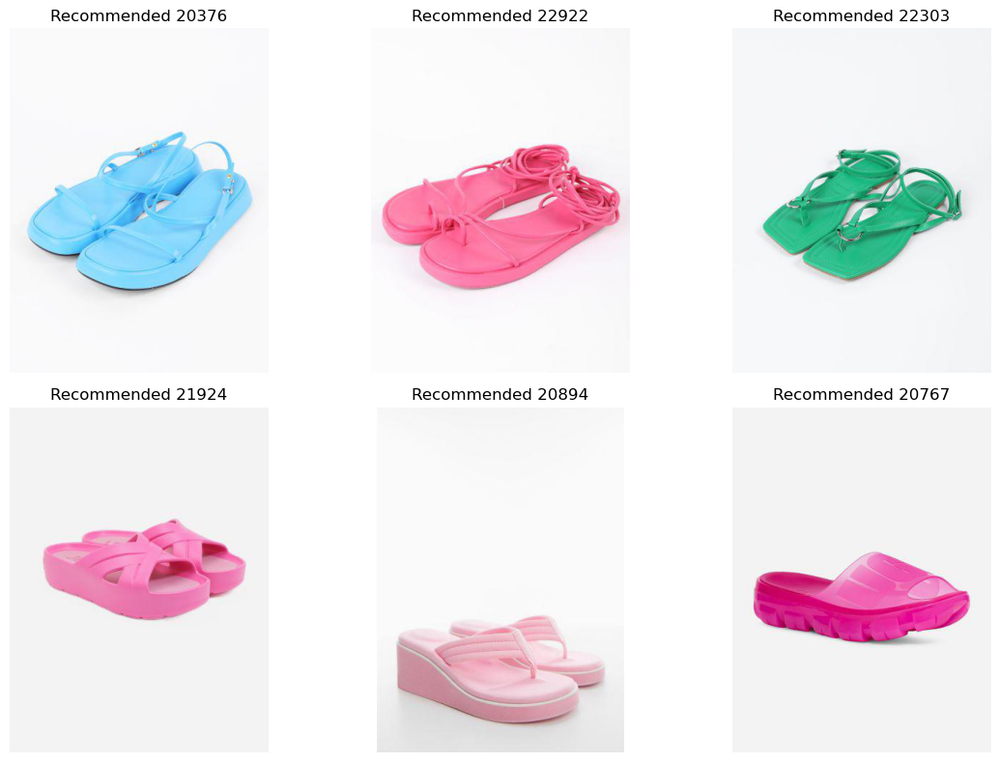

Recommended Items for image 13257:
               type color gender    category
13651         jeans  2060  women  Bottomwear
13530         jeans  2060  women  Bottomwear
13550         jeans     9  women  Bottomwear
15348         jeans  8621  women  Bottomwear
17122    long-pants  2148  women  Bottomwear
10588  dress-shirts  8988  women     Topwear


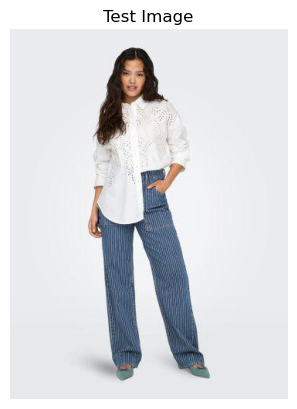

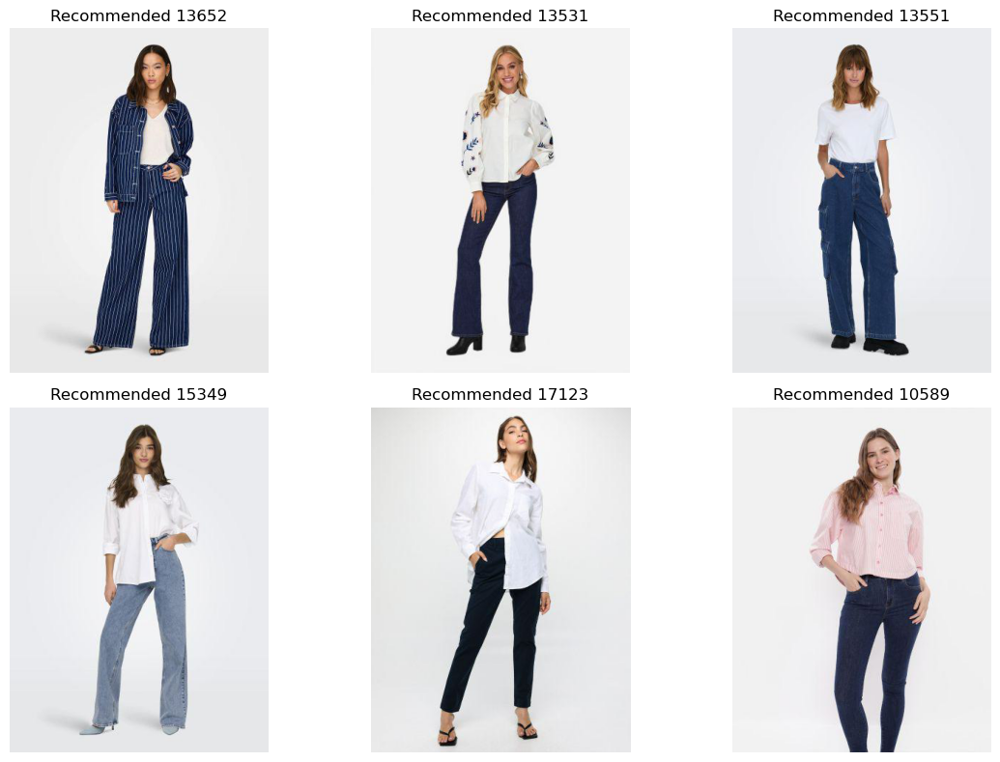

Recommended Items for image 7296:
             type  color gender    category
7324  sweatshirts   9408    men     Topwear
3008   long-pants      7    men  Bottomwear
4263      joggers      4    men  Bottomwear
1646        jeans      9    men  Bottomwear
2626        jeans      7    men  Bottomwear
2479        jeans  10008    men  Bottomwear


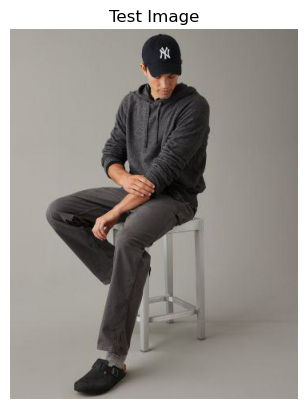

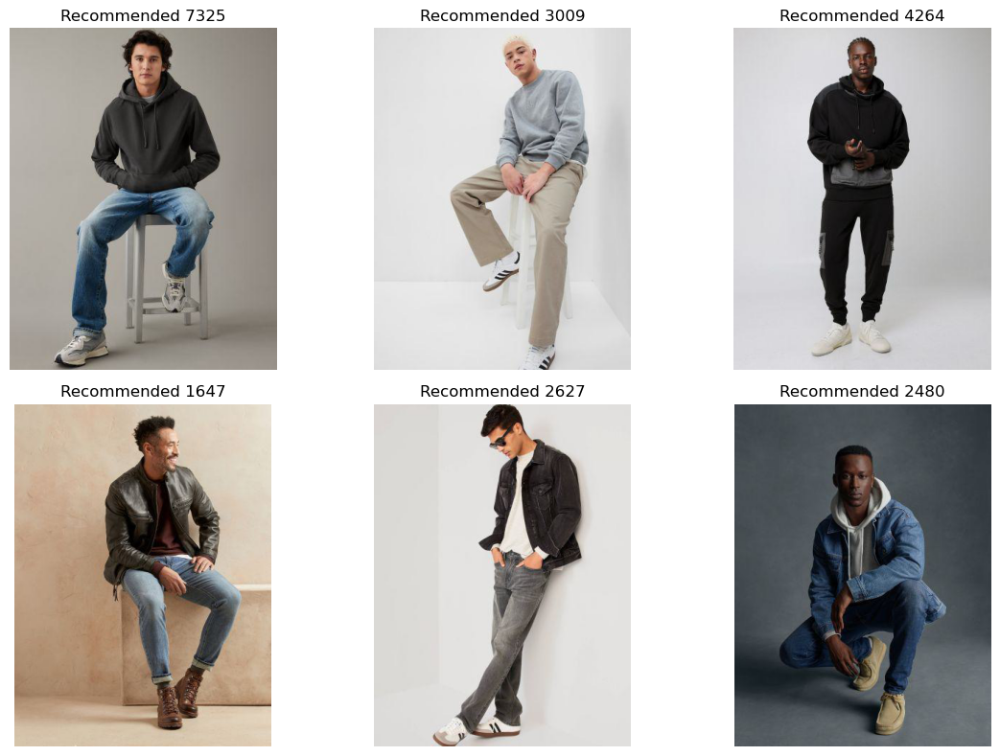

Recommended Items for image 6971:
              type  color gender    category
5165       joggers   9048    men  Bottomwear
3971       joggers      7    men  Bottomwear
794   dress-shirts      4    men     Topwear
1676         jeans  10008    men  Bottomwear
1298       tshirts   9077    men     Topwear
1770         jeans      4    men  Bottomwear


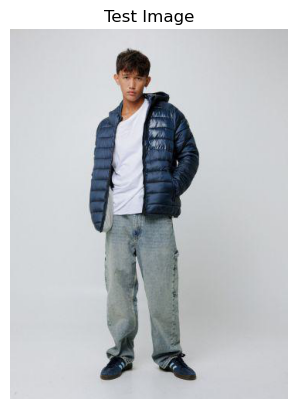

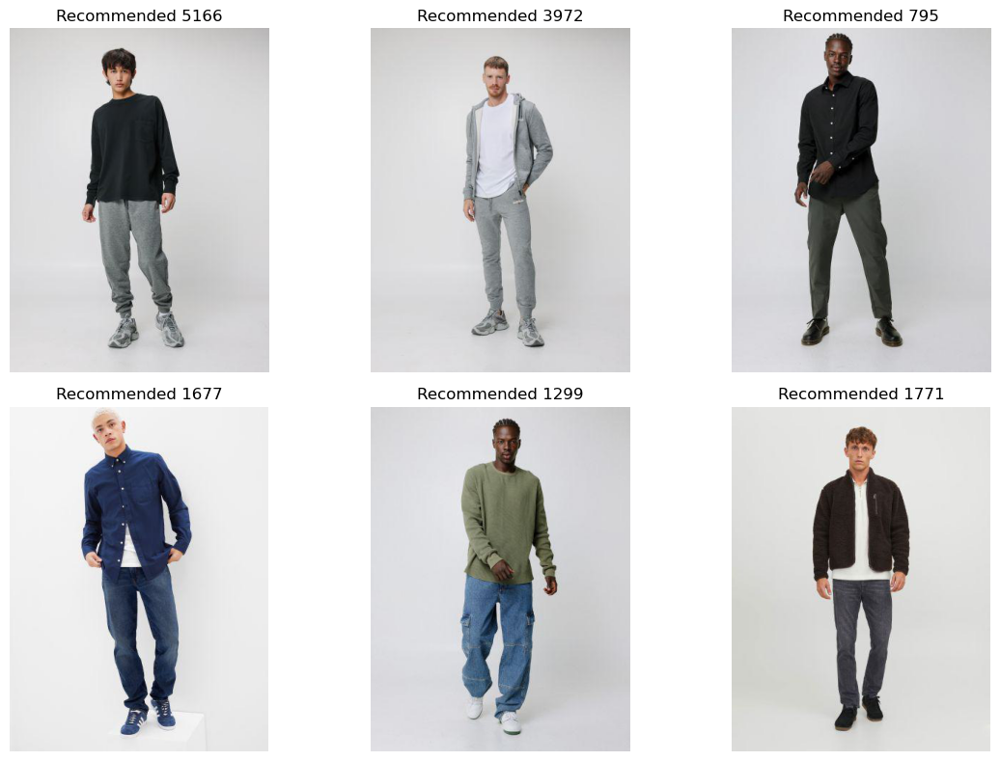

Recommended Items for image 22459:
                 type color gender  category
20358  sneakers-shoes    10  women  Footwear
20300  sneakers-shoes    10  women  Footwear
22247  sneakers-shoes    10  women  Footwear
22061  sneakers-shoes  8602  women  Footwear
20138  sneakers-shoes    10  women  Footwear
20385  sneakers-shoes    10  women  Footwear


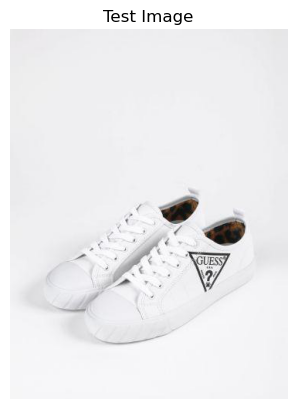

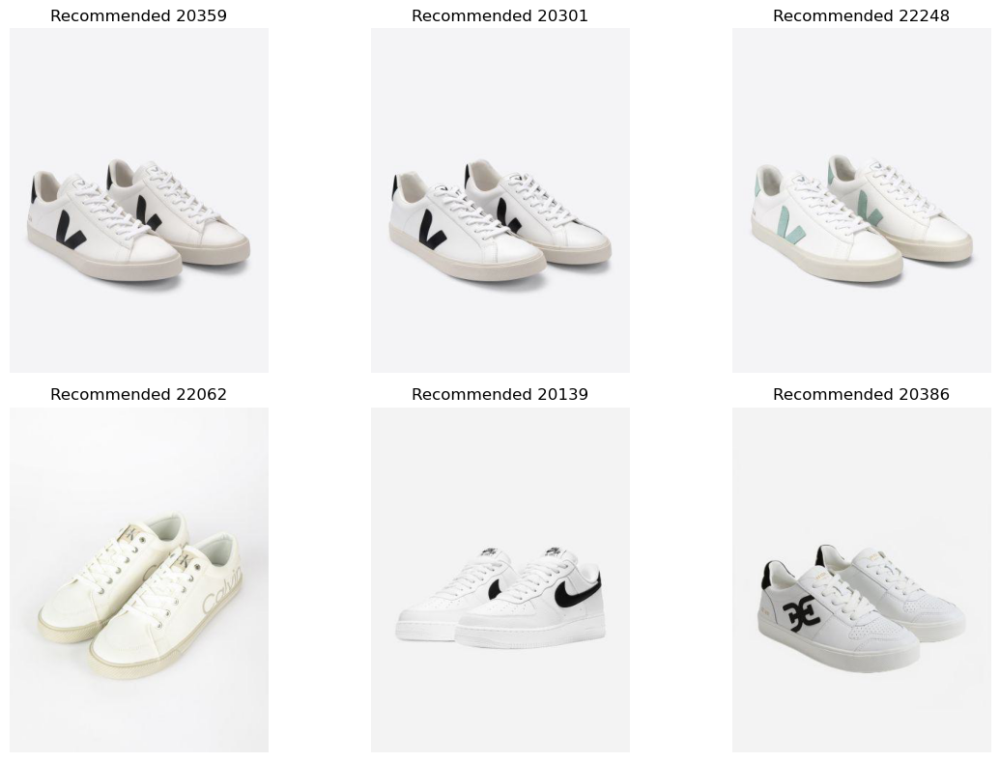

Recommended Items for image 12415:
              type  color gender    category
14002    tank-tops  17762  women     Topwear
15366   long-pants  17762  women  Bottomwear
17266   long-pants  17762  women  Bottomwear
15161   long-pants    100  women  Bottomwear
25616  sweatshirts     22  women     Topwear
24640  sweatshirts  17762  women     Topwear


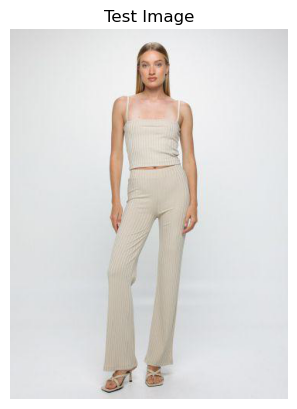

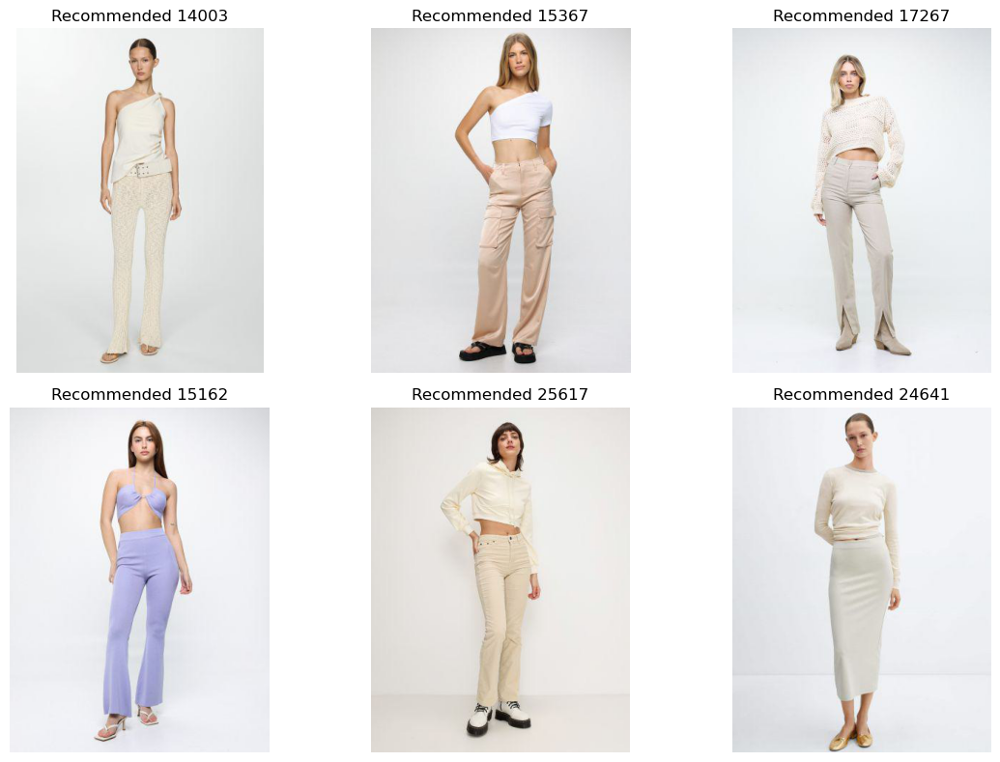

In [256]:
import random

# Generate recommendations for 10 random images
num_recommendations = 10
random_indices = random.sample(range(len(df)), num_recommendations)

for idx_test in random_indices:
    recommended_df, sim_values = get_recommender(idx_test, df, top_n=6)

    print(f"Recommended Items for image {idx_test}:")
    print(recommended_df[['type', 'color', 'gender', 'category']])

    # Plot the test image
    plt.figure()
    plt.imshow(plt.imread(df.iloc[idx_test].image_path))
    plt.title('Test Image')
    plt.axis('off')
    plt.show()

    # Generate a dictionary of (title, images) for recommendations
    figures = {f'Recommended {i+1}': row.image_path for i, row in recommended_df.iterrows()}

    # Plot the images in a figure, with 2 rows and 3 columns
    plot_figures(figures, 2, 3)
    plt.show()


In [258]:
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt


In [260]:
# Apply t-SNE to reduce the dimensionality of the embeddings to 2D
tsne = TSNE(n_components=2, random_state=42)
tsne_embeddings = tsne.fit_transform(embeddings)

# Add t-SNE results to the dataframe
df['tsne-2d-one'] = tsne_embeddings[:, 0]
df['tsne-2d-two'] = tsne_embeddings[:, 1]


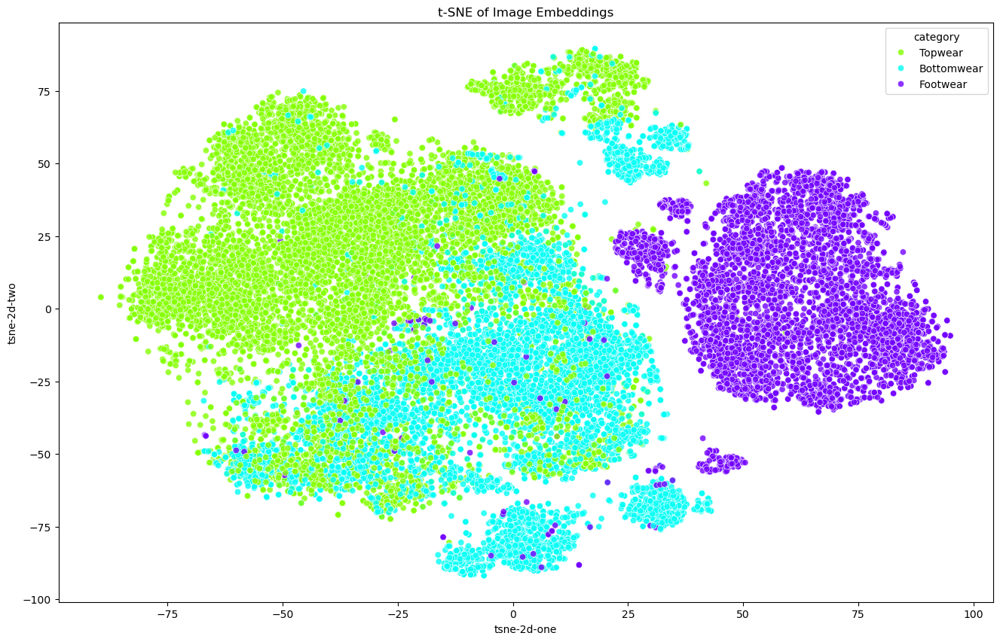

In [262]:
# Plot t-SNE results
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="category",  # Change this to any column you want to color by
    palette=sns.color_palette("hsv", len(df['category'].unique())),
    data=df,
    legend="full",
    alpha=0.8
)
plt.title('t-SNE of Image Embeddings')
plt.show()


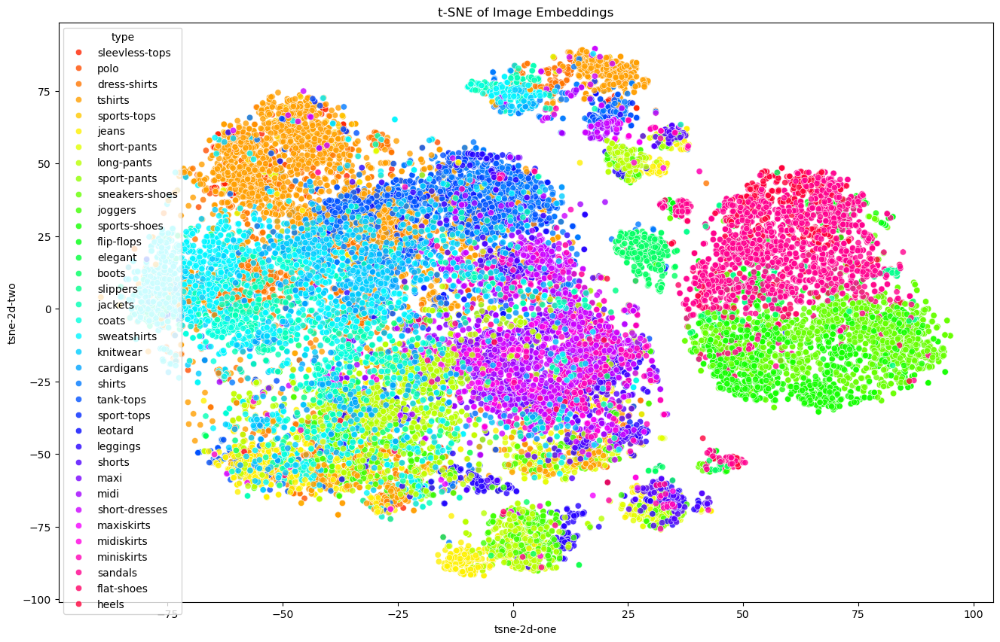

In [266]:
# Plot t-SNE results
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="type",  # Change this to any column you want to color by
    palette=sns.color_palette("hsv", len(df['type'].unique())),
    data=df,
    legend="full",
    alpha=0.8
)
plt.title('t-SNE of Image Embeddings')
plt.show()

In [268]:
# Save the sample, embeddings, and metadata to CSV files
df_sample = df.sample(10)
df_sample.to_csv('df_sample.csv', index=False)

# Convert the embeddings to a DataFrame
embeddings_df = pd.DataFrame(embeddings)
embeddings_df.to_csv('embeddings.csv', index=False)

# Save the complete metadata
df.to_csv('metadados.csv', index=False)
